Loading: /Users/christiankwok/my wunderfund_challenge/wunderfund_challenge/competition_package/examples/r2.3460/lstm_weights.pt
Shapes: (968, 32) (968, 32)


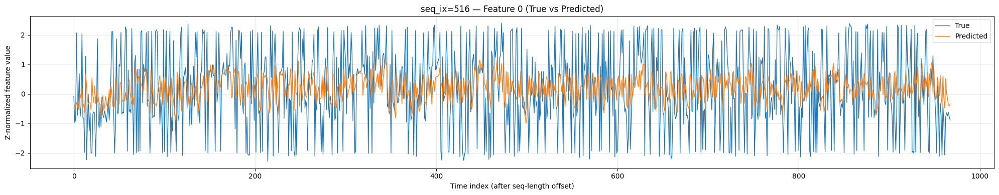

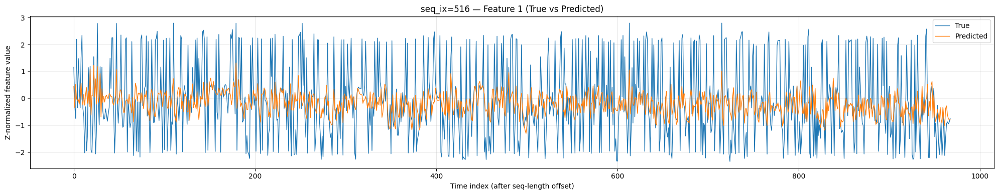

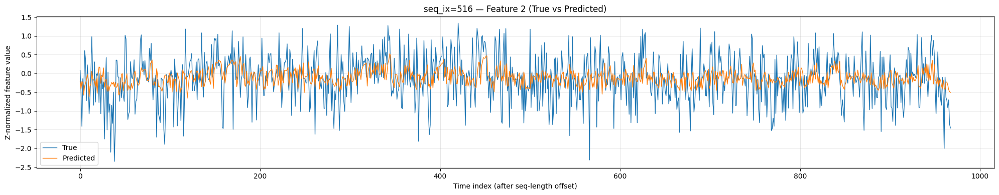

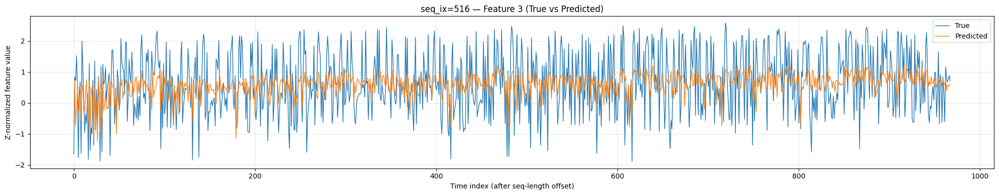

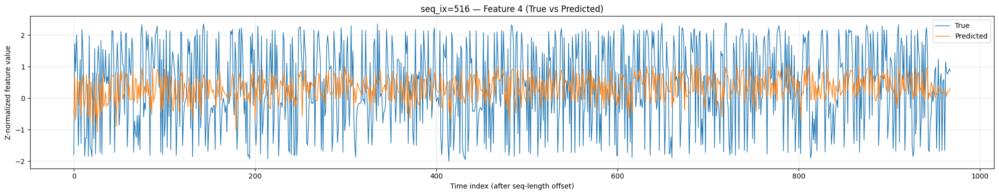

...

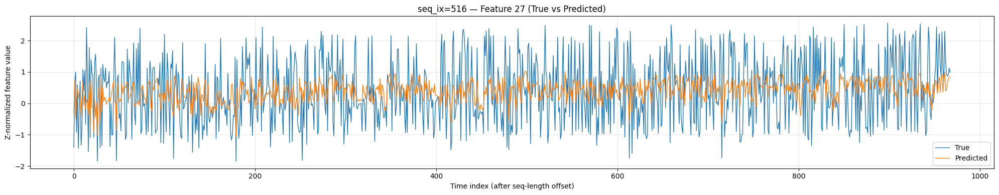

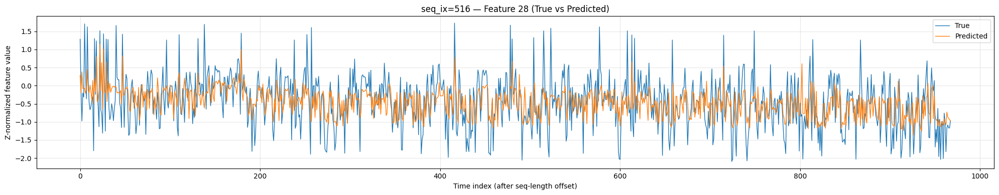

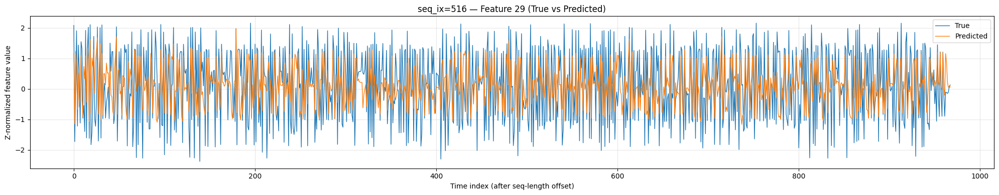

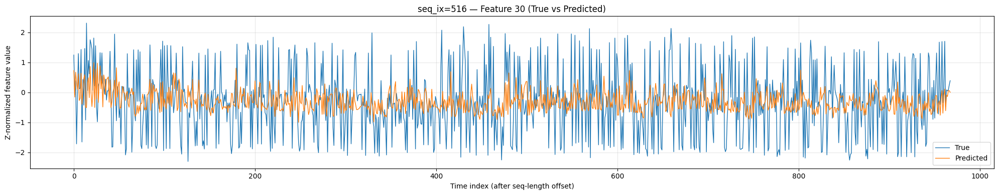

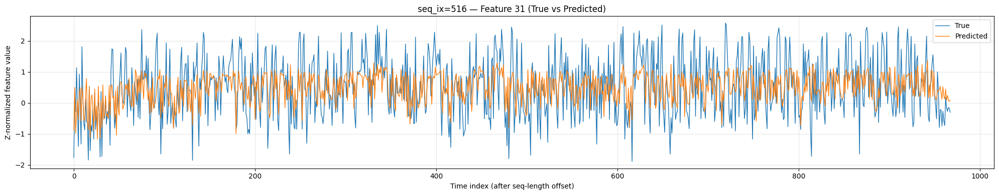


Done plotting ✓


In [4]:
import os, sys, numpy as np, torch, torch.nn as nn, pandas as pd, matplotlib.pyplot as plt
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
CURRENT_DIR = os.getcwd()
sys.path.append(f"{CURRENT_DIR}/../..")
from utils import ScorerStepByStep

class PredictionModel(nn.Module):
    def __init__(self):
        super().__init__()
        self.dim = 32
        self.hidden_size = 64
        self.num_layers = 1

        self.lstm = nn.LSTM(self.dim, self.hidden_size, self.num_layers, batch_first=True)
        self.fc = nn.Linear(self.hidden_size, self.dim)

        weights_path = os.path.join(CURRENT_DIR, "lstm_weights.pt")
        print("Loading:", weights_path)
        self.load_state_dict(torch.load(weights_path, map_location=DEVICE))
        self.to(DEVICE)

    def forward(self, x):
        out, _ = self.lstm(x)
        return self.fc(out[:, -1])

def make_sequences(arr32, seq_len=32):
    X, y = [], []
    for i in range(len(arr32) - seq_len):
        X.append(arr32[i:i+seq_len])
        y.append(arr32[i+seq_len])
    return np.stack(X), np.stack(y)

seq_id = 516   # ← change this to view other sequences

train_file = f"{CURRENT_DIR}/../../datasets/train.parquet"
scorer = ScorerStepByStep(train_file)
df = scorer.dataset

df_seq = df[df["seq_ix"] == seq_id].sort_values("step_in_seq").reset_index(drop=True)
arr32 = df_seq.iloc[:, 3:35].to_numpy().astype(np.float32)

X_np, y_true = make_sequences(arr32, seq_len=32)
X = torch.tensor(X_np, dtype=torch.float32).to(DEVICE)

model = PredictionModel(); model.eval()
with torch.no_grad():
    y_pred = model(X).cpu().numpy()

print("Shapes:", y_true.shape, y_pred.shape)

for k in range(32):
    plt.figure(figsize=(20, 4))

    plt.plot(y_true[:, k], label="True", linewidth=1)
    plt.plot(y_pred[:, k], label="Predicted", linewidth=1)
    plt.title(f"seq_ix={seq_id} — Feature {k} (True vs Predicted)")
    plt.xlabel("Time index (after seq-length offset)")
    plt.ylabel("Z-normalized feature value")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

print("\nDone plotting ✓")
